# Week 27 - Progress Log

/var/folders/37/n26ttb4n16xb2c3z17l2p6r00000gp/T/ipykernel_76078/1690409104.py:91: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(custom_labels)


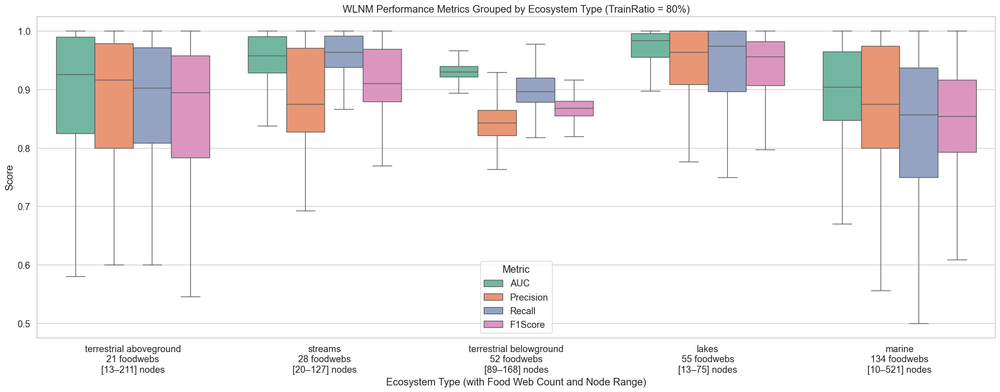

In [1]:
import os
import glob
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# === CONFIG ===
results_dir = "../../src/matlab/data/result_stable_version_290/prediction_scores_logs"
ecosystem_file = "../../src/matlab/data/foodwebs_mat/foodweb_metrics_ecosystem.csv"

# === CUSTOM LABELS ===
ecosystem_labels = {
    "terrestrial aboveground": "terrestrial aboveground\n21 foodwebs\n[13–211] nodes",
    "streams": "streams\n28 foodwebs\n[20–127] nodes",
    "terrestrial belowground": "terrestrial belowground\n52 foodwebs\n[89–168] nodes",
    "lakes": "lakes\n55 foodwebs\n[13–75] nodes",
    "marine": "marine\n134 foodwebs\n[10–521] nodes"
}

ecosystem_order = [
    "terrestrial aboveground",
    "streams",
    "terrestrial belowground",
    "lakes",
    "marine"
]

custom_labels = [ecosystem_labels[eco] for eco in ecosystem_order]

# === LOAD FILES ===
# Load ecosystem mapping
df_ecosystem = pd.read_csv(ecosystem_file)

# Load all merged result files
csv_files = glob.glob(os.path.join(results_dir, "*_results_random.csv"))
dfs = []

for file in csv_files:
    df = pd.read_csv(file)

    # Extract full foodweb name (e.g., WP1_tax_mass)
    filename = os.path.basename(file)
    foodweb = filename.split("_results_")[0]

    df["Foodweb"] = foodweb
    dfs.append(df)

if not dfs:
    raise RuntimeError("❌ No result CSVs found. Check the path or pattern.")

df_all = pd.concat(dfs, ignore_index=True)

# Merge with ecosystem types
df_merged = pd.merge(df_all, df_ecosystem[["Foodweb", "ecosystem.type"]], on="Foodweb", how="left")

# Melt for plotting all metrics
df_plot = df_merged.melt(
    id_vars=["ecosystem.type", "Foodweb", "Iteration"],
    value_vars=["AUC", "Precision", "Recall", "F1Score"],
    var_name="Metric",
    value_name="Value"
)

# === ORDER ECOSYSTEMS BY SIZE ===
ecosystem_order = (
    df_merged[["Foodweb", "ecosystem.type"]]
    .drop_duplicates()
    .groupby("ecosystem.type")
    .size()
    .sort_values()
    .index
    .tolist()
)

# === PLOT ===
sns.set(style="whitegrid", font_scale=1.2)
plt.figure(figsize=(20, 8))
ax = sns.boxplot(
    data=df_plot,
    x="ecosystem.type",
    y="Value",
    hue="Metric",
    palette="Set2",
    showfliers=False,
    order=ecosystem_order  # <- custom order here
)

ax.set_title("WLNM Performance Metrics Grouped by Ecosystem Type (TrainRatio = 80%)")
ax.set_ylabel("Score")
ax.set_xlabel("Ecosystem Type (with Food Web Count and Node Range)")
ax.set_xticklabels(custom_labels)
plt.legend(title="Metric")
plt.tight_layout()
plt.show()

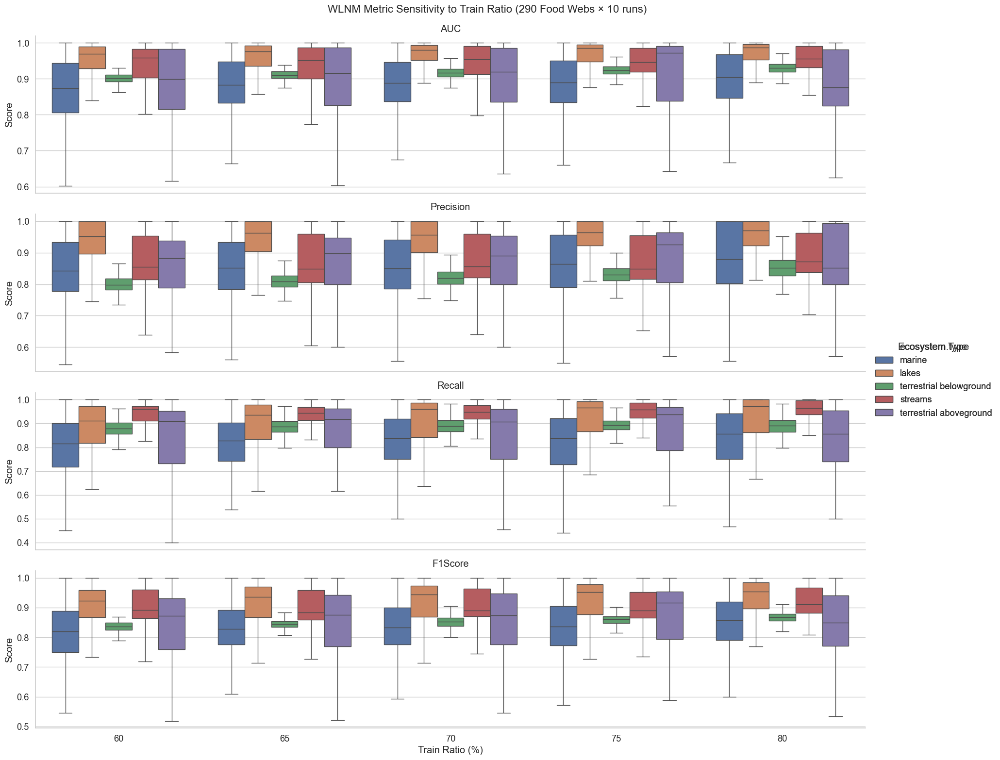

In [5]:
import os
import glob
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# === CONFIG ===
results_dir = "../../src/matlab/data/result/prediction_scores_logs"
ecosystem_file = "../../src/matlab/data/foodwebs_mat/foodweb_metrics_ecosystem.csv"

# === LOAD METADATA ===
df_ecosystem = pd.read_csv(ecosystem_file)

# === LOAD RESULT FILES ===
csv_files = glob.glob(os.path.join(results_dir, "*_results_random.csv"))
dfs = []

for file in csv_files:
    df = pd.read_csv(file)
    
    filename = os.path.basename(file)
    foodweb = filename.split("_results_")[0]  # e.g., AEW03_tax_mass

    df["Foodweb"] = foodweb
    dfs.append(df)

if not dfs:
    raise RuntimeError("❌ No CSVs found in results directory.")

df_all = pd.concat(dfs, ignore_index=True)

# Merge ecosystem type
df_all = pd.merge(df_all, df_ecosystem[["Foodweb", "ecosystem.type"]], on="Foodweb", how="left")

# Melt metrics for plotting
df_plot = df_all.melt(
    id_vars=["Foodweb", "TrainRatio", "ecosystem.type", "Iteration"],
    value_vars=["AUC", "Precision", "Recall", "F1Score"],
    var_name="Metric",
    value_name="Value"
)

# Convert TrainRatio to categorical for consistent x-axis ordering
df_plot["TrainRatio"] = df_plot["TrainRatio"].astype(str)

# === PLOT ===
sns.set(style="whitegrid", font_scale=1.2)
g = sns.catplot(
    data=df_plot,
    x="TrainRatio",
    y="Value",
    hue="ecosystem.type",
    row="Metric",
    kind="box",
    height=4,
    aspect=4,
    sharey=False,
    showfliers=False
)

g.set_titles("{row_name}")
g.set_axis_labels("Train Ratio (%)", "Score")
g.fig.subplots_adjust(top=0.94)
g.fig.suptitle("WLNM Metric Sensitivity to Train Ratio (290 Food Webs × 10 runs)", fontsize=16)
g.add_legend(title="Ecosystem Type")

plt.show()

### 📊 Analysis of each combination (`prey_role → predator_role`):

| Interaction         | Plausible? | Justification                                                                                          |
| ------------------- | ---------- | ------------------------------------------------------------------------------------------------------ |
| `both→both`         | ✅          | Intermediaries feeding on each other. Valid energy flow between organisms that both eat and are eaten. |
| `resource→both`     | ✅          | Pure resource (e.g. plant) consumed by an intermediate organism (e.g. omnivore).                       |
| `both→consumer`     | ✅          | Intermediate organism transferring energy to a strict predator.                                        |
| `resource→consumer` | ✅          | Classic pattern: plant → herbivore, algae → fish.                                                      |
| `consumer→consumer` | ✅          | Flow between predators (e.g. cannibalism, intra-guild predation).                                      |
| `consumer→both`     | ❌          | Strict predator consumed by an omnivore (less common, but plausible).                                  |
| `consumer→resource` | ❌          | Inverted flow: a consumer doesn't transfer energy to a resource (a plant doesn't feed on a herbivore). |
| `resource→resource` | ❌          | Two basal organisms do not interact this way.                                                          |
| `both→resource`     | ❌          | A resource should not receive energy (doesn't consume anyone).                                         |



=== Processing: Twin Lake East_tax_mass ===


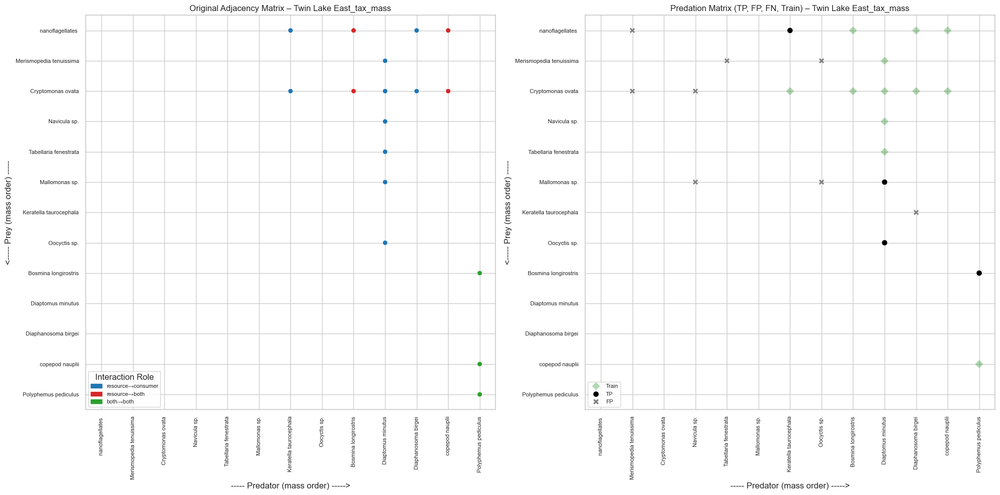


=== Processing: Brook trout lake_tax_mass ===


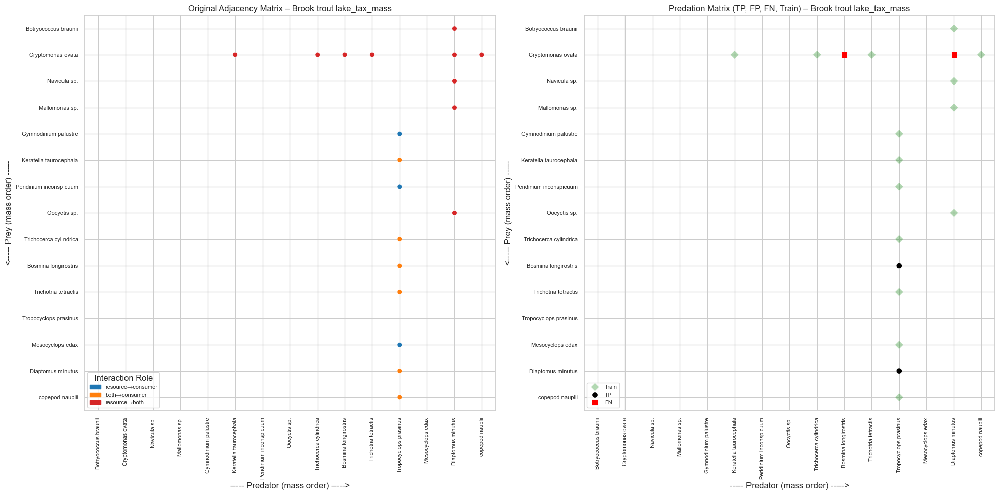


=== Processing: SF2M2_tax_mass ===


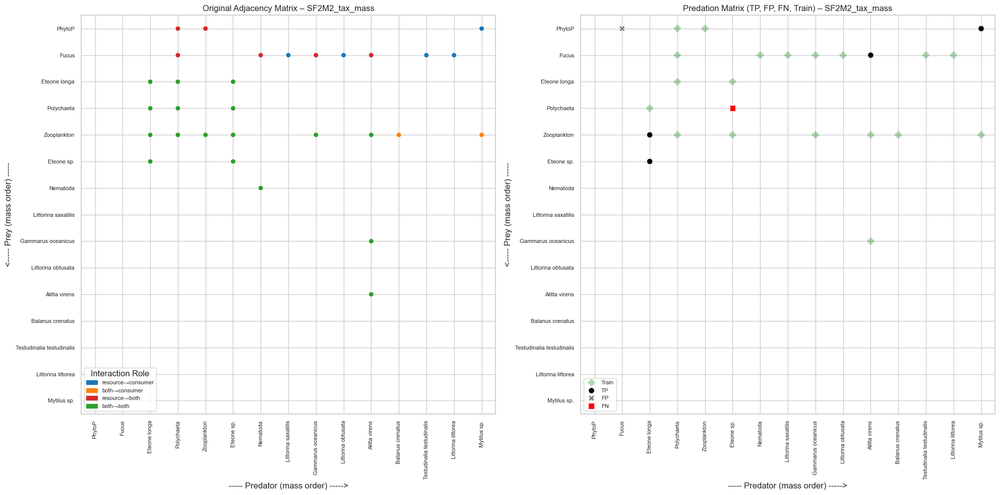


=== Processing: CGP1_tax_mass ===


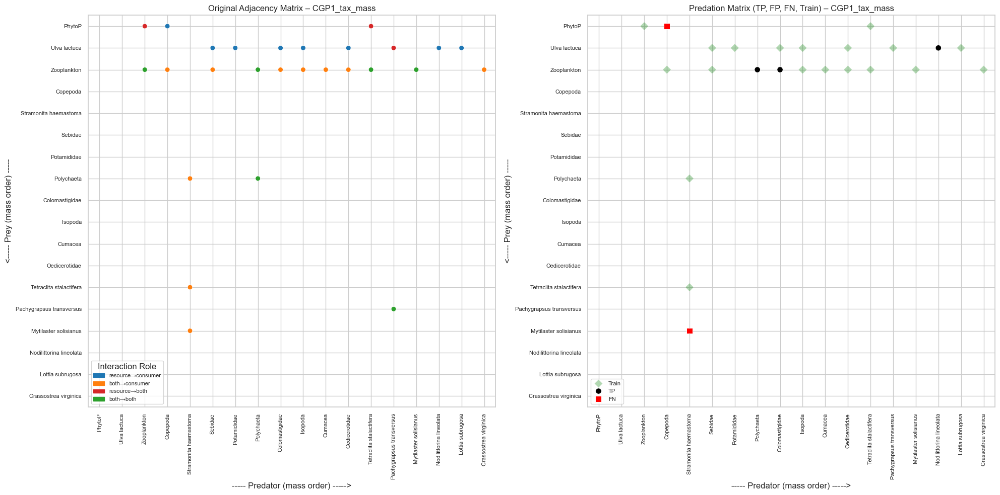


=== Processing: SF1I2_tax_mass ===


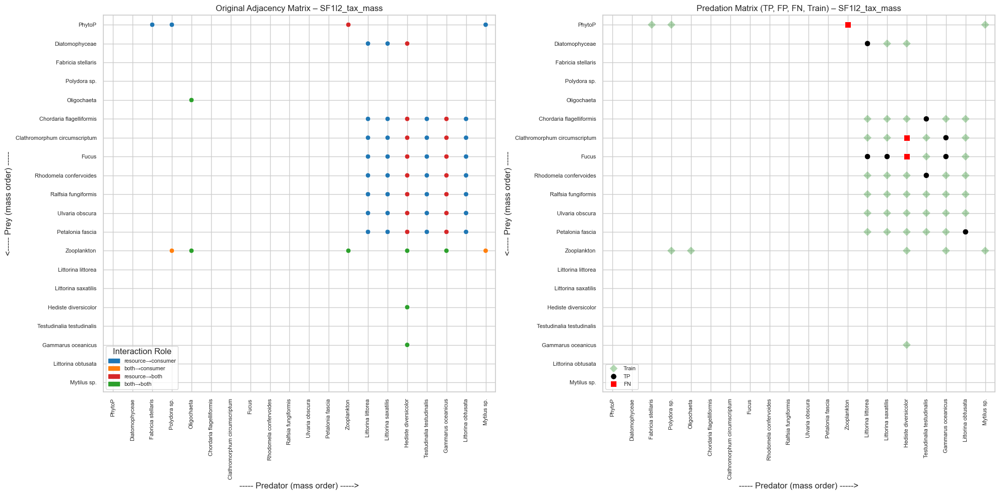


=== Processing: PGUBP3_tax_mass ===


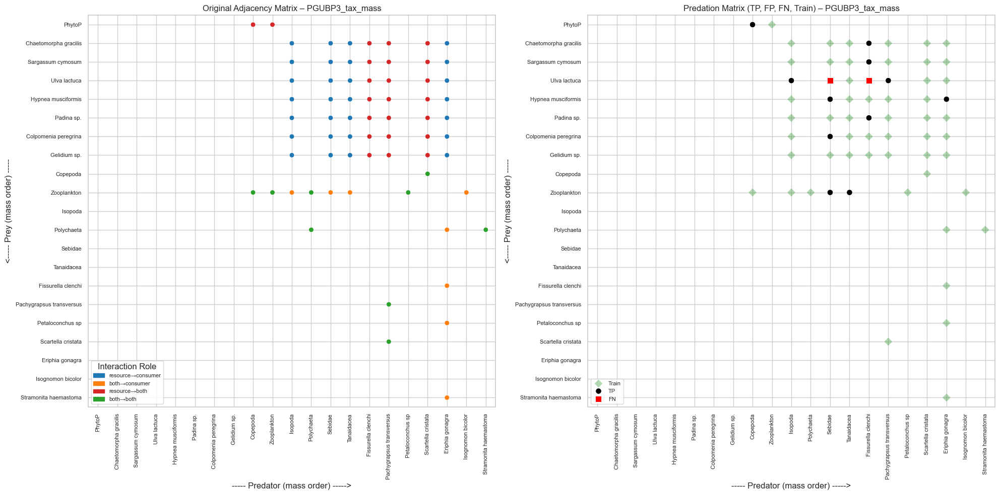


=== Processing: SF1I4_tax_mass ===


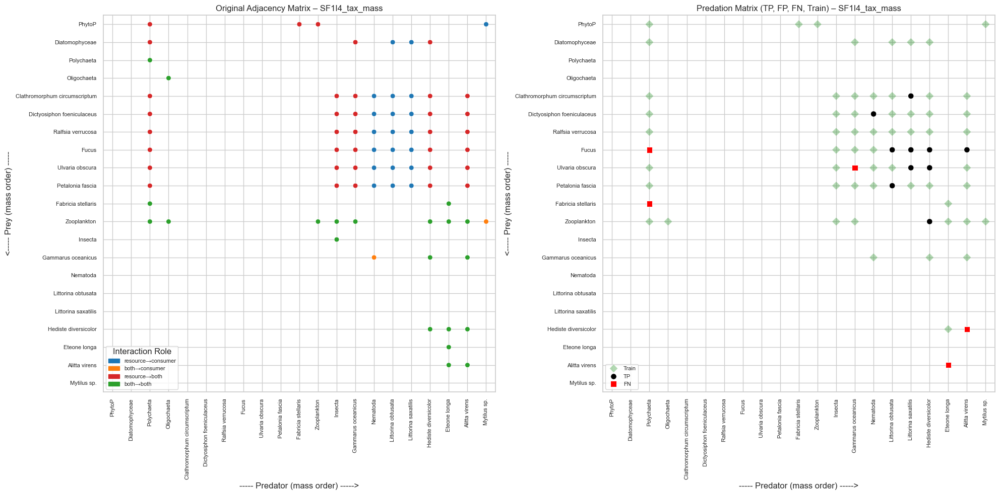


=== Processing: PP1I1_tax_mass ===


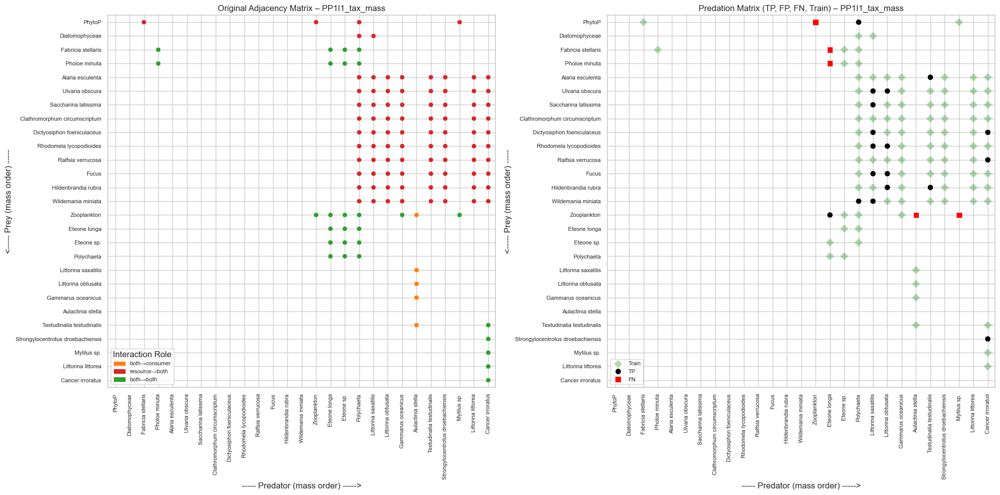


=== Processing: WP4_tax_mass ===


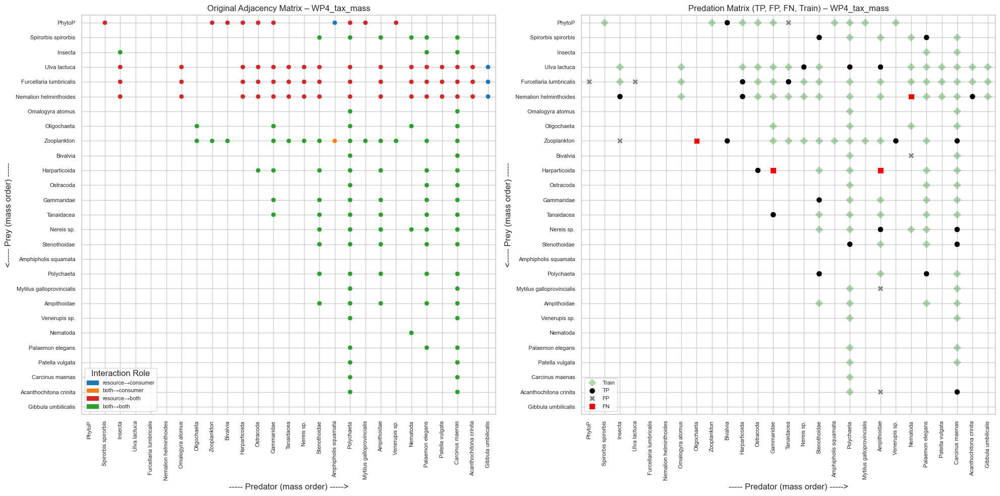


=== Processing: GJBP3_tax_mass ===


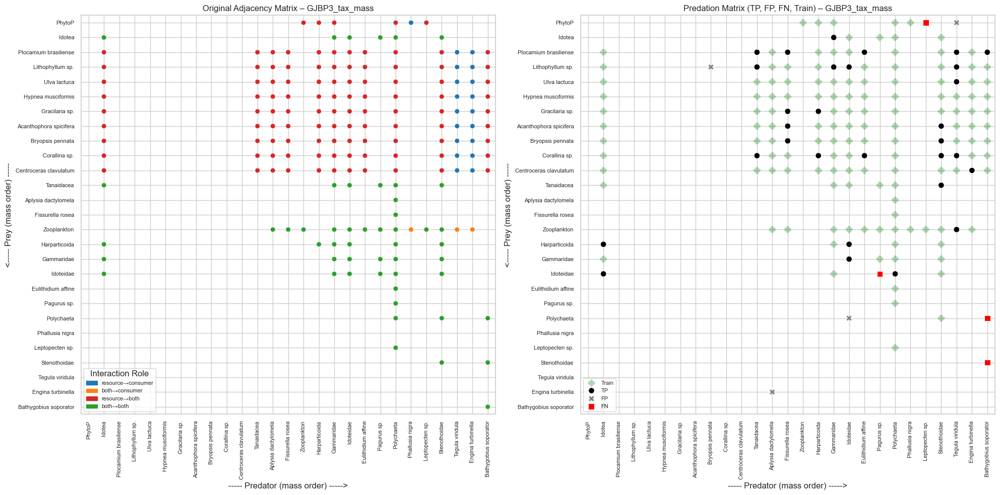


=== Processing: CGP3_tax_mass ===


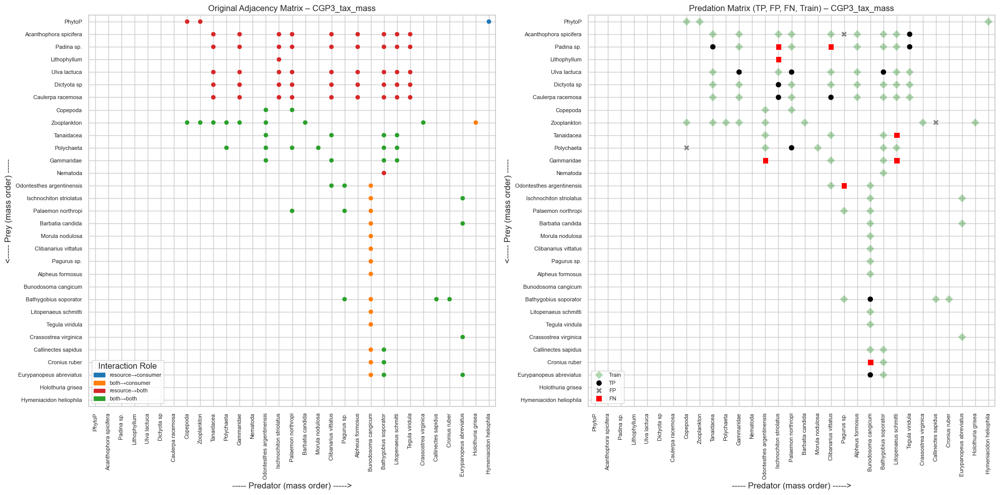


=== Processing: Fawn lake_tax_mass ===


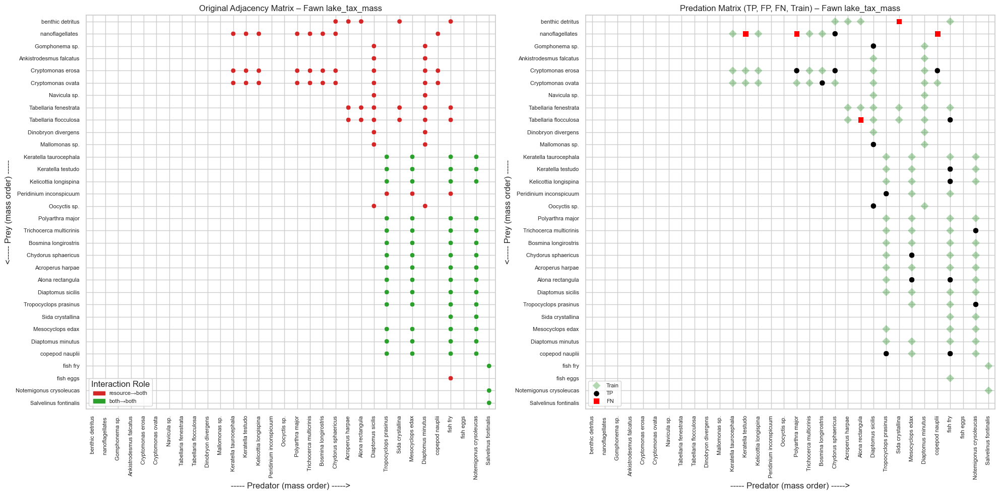


=== Processing: MBP1_tax_mass ===


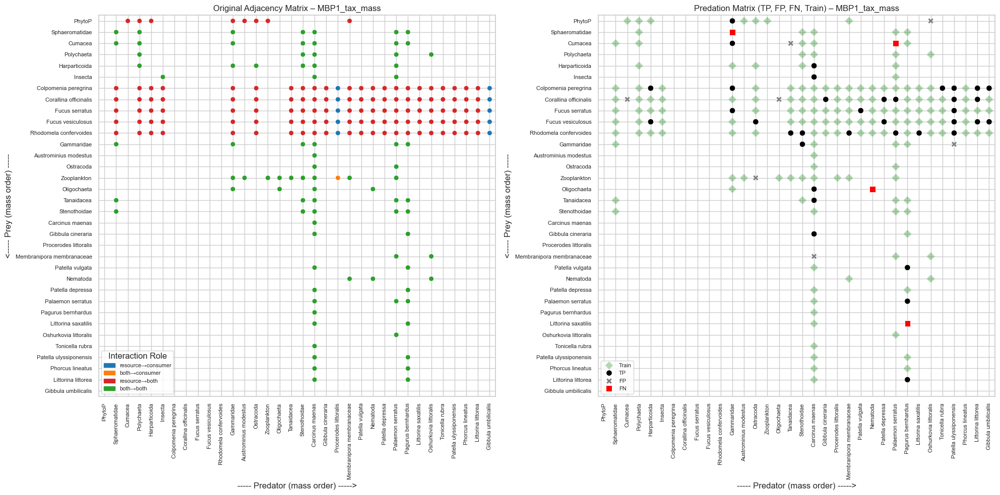


=== Processing: Indian Lake_tax_mass ===


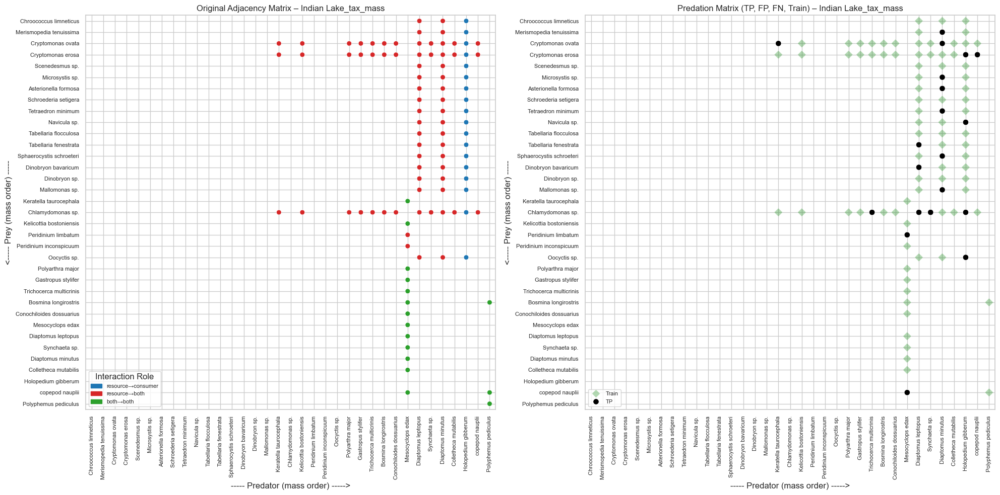


=== Processing: MBP3_tax_mass ===


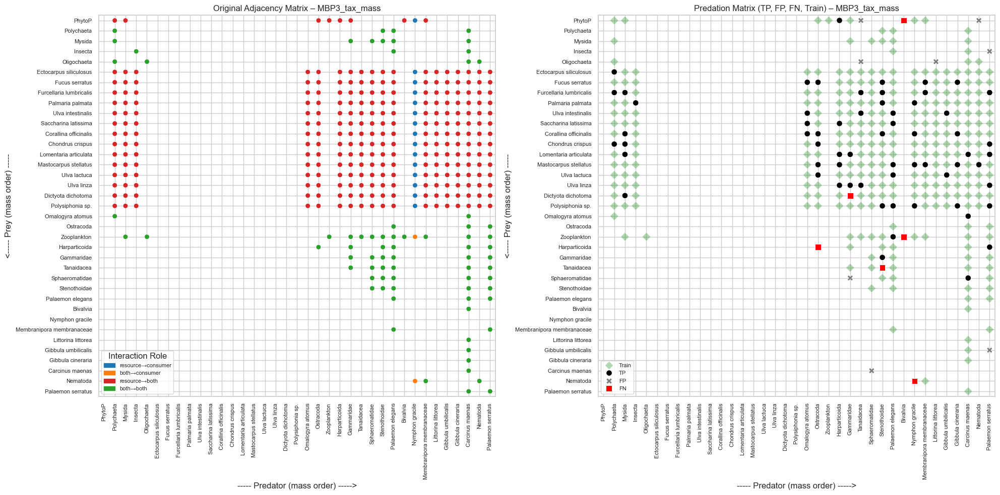


=== Processing: L4P3_tax_mass ===


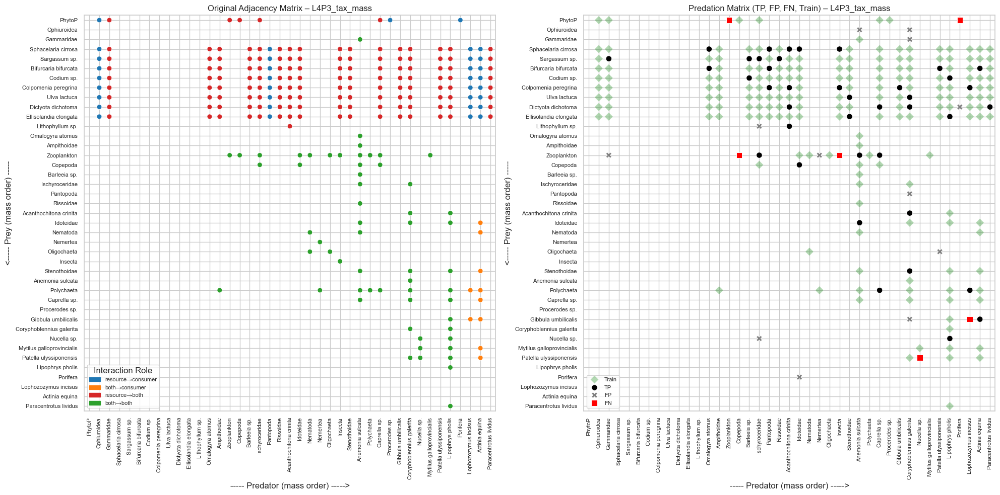


=== Processing: L2P1_tax_mass ===


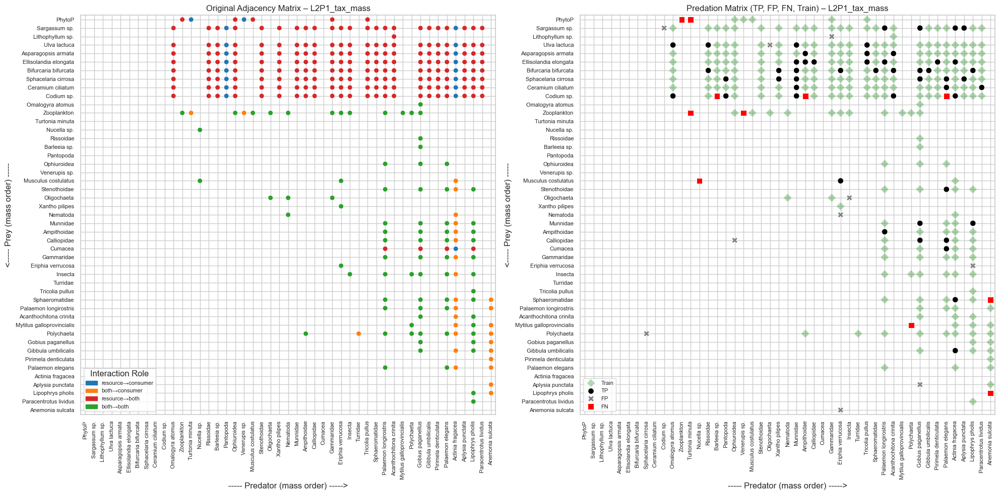


=== Processing: L3P3_tax_mass ===


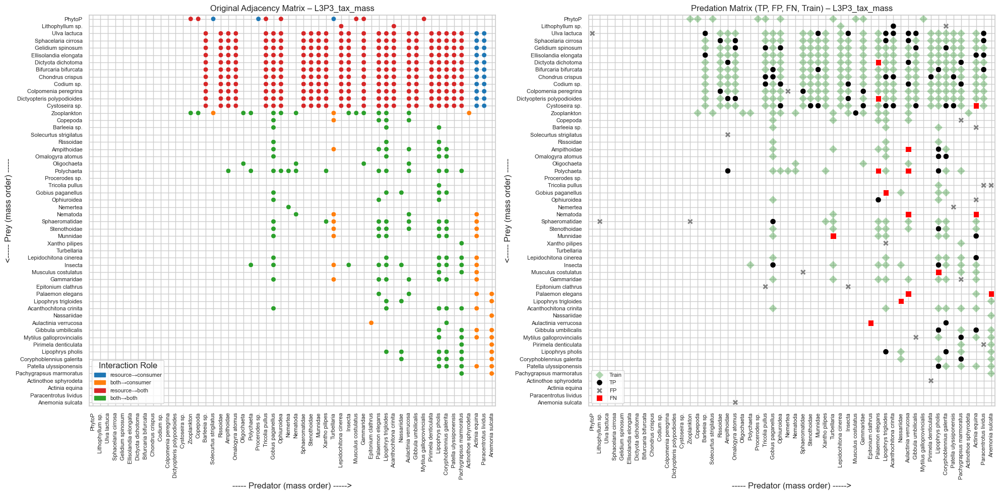


=== Processing: German Creek_tax_mass ===


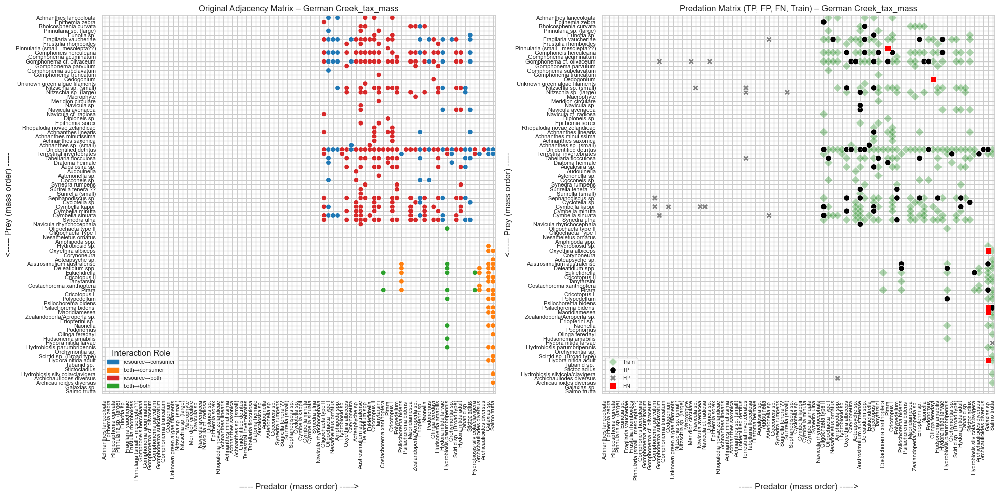


=== Processing: Ythan Estuary_tax_mass ===


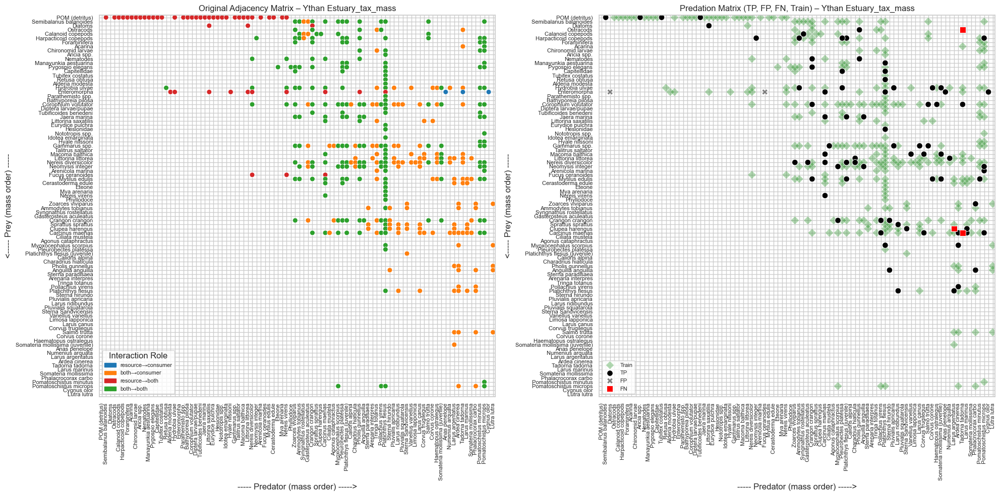


=== Processing: Broad Stream_tax_mass ===


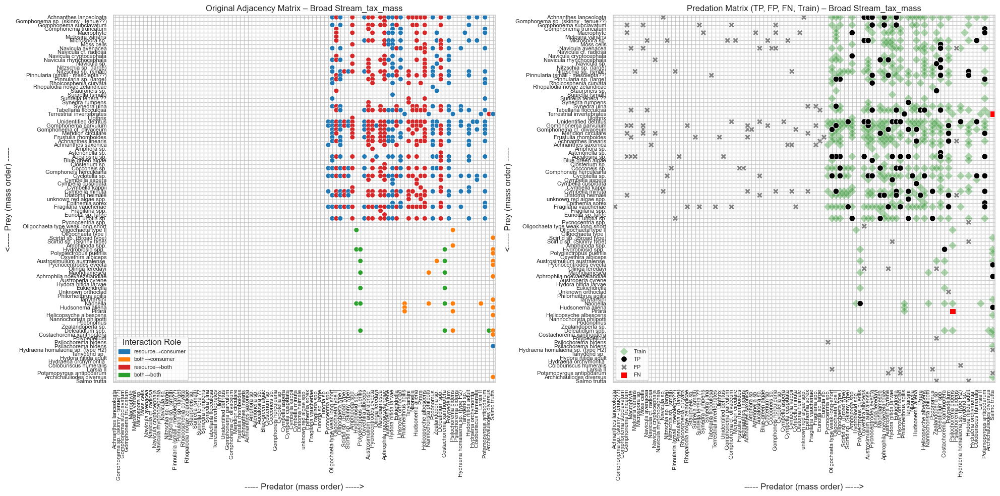


=== Processing: Chilean Intertidal El Quisco_tax_mass ===


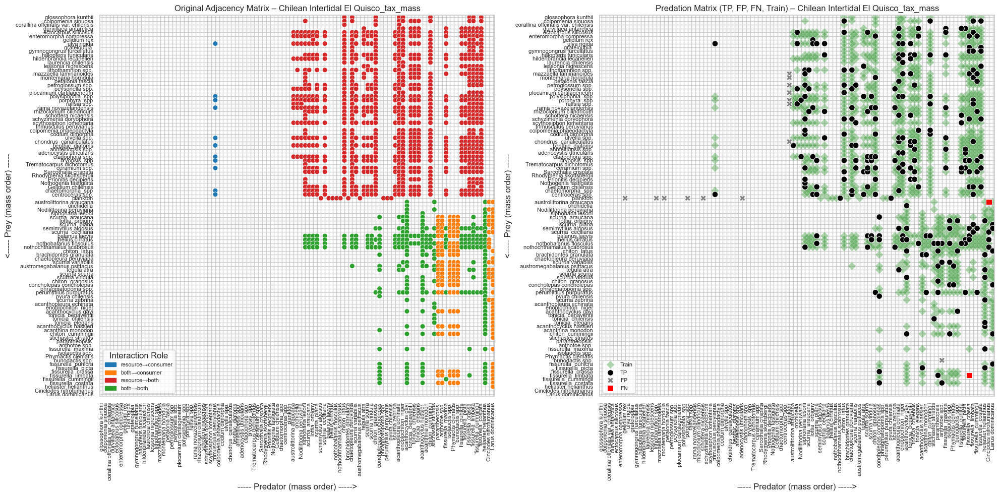


=== Processing: SEW01_tax_mass ===


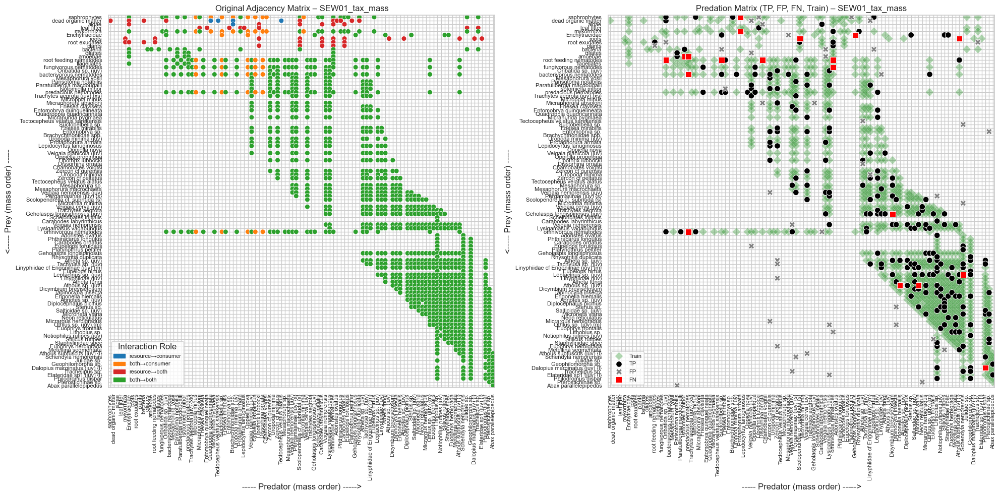


=== Processing: Chilean Intertidal Los Molles_tax_mass ===


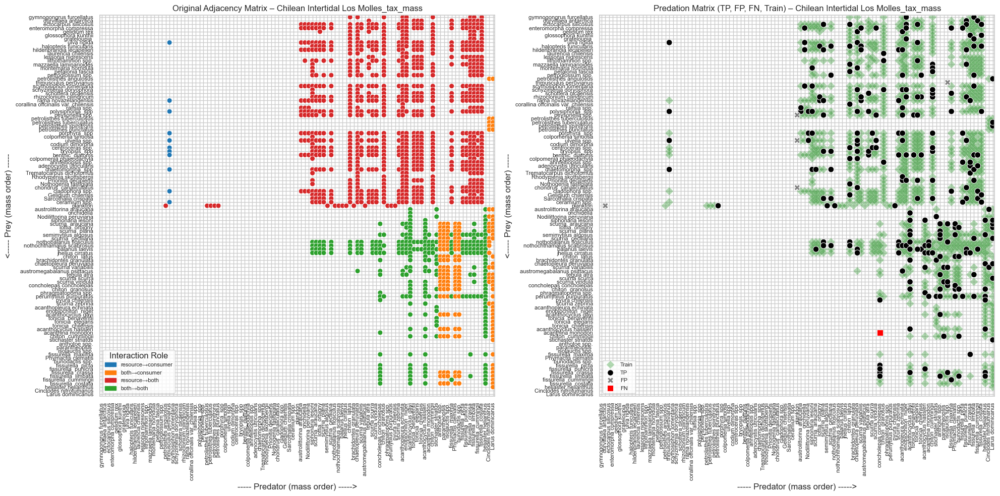


=== Processing: Dempsters Stream_tax_mass ===


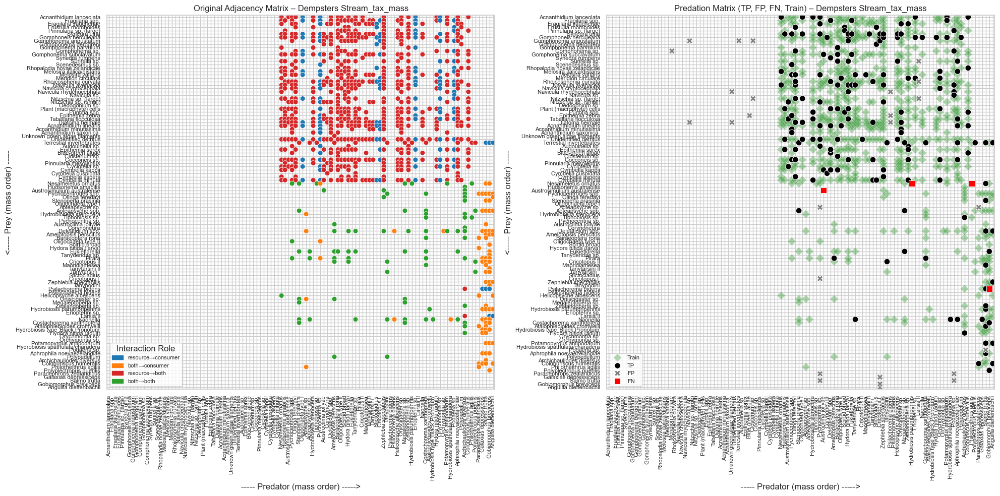


=== Processing: Gearagh_tax_mass ===


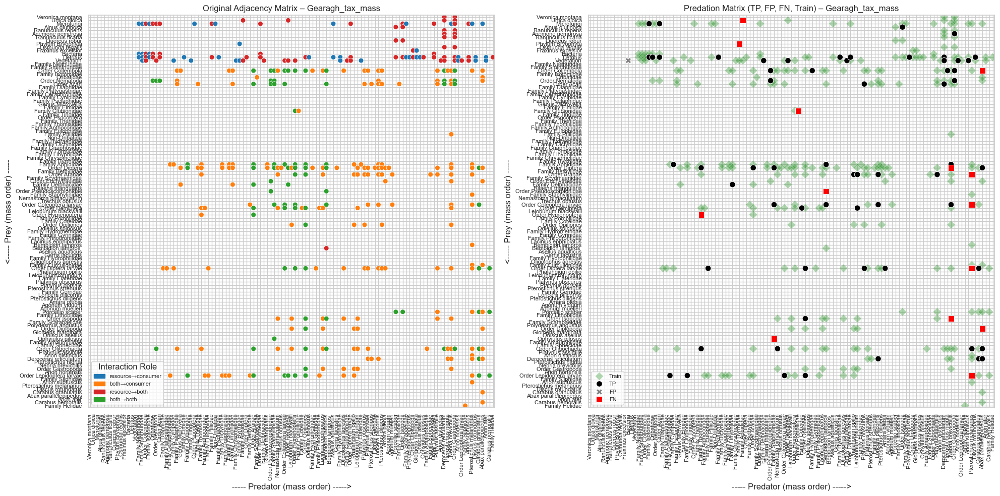


=== Processing: SEW03_tax_mass ===


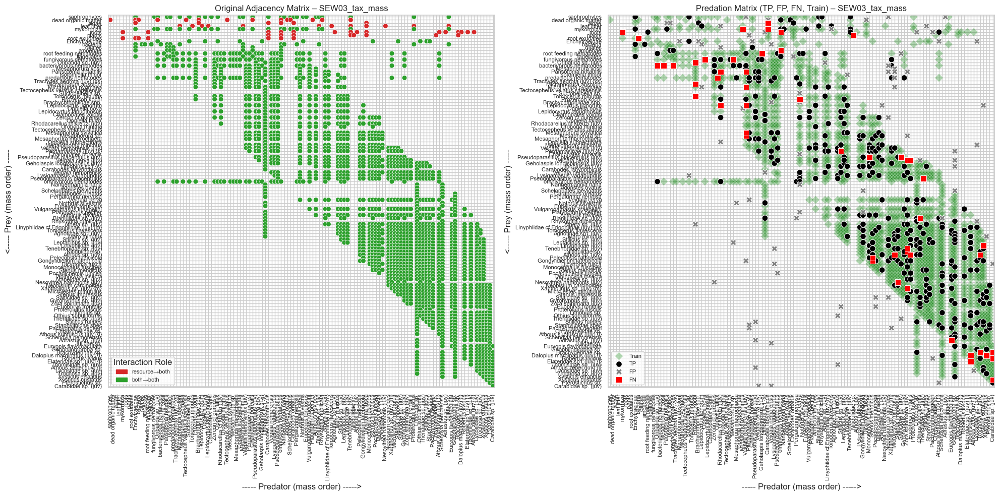


=== Processing: AEW03_tax_mass ===


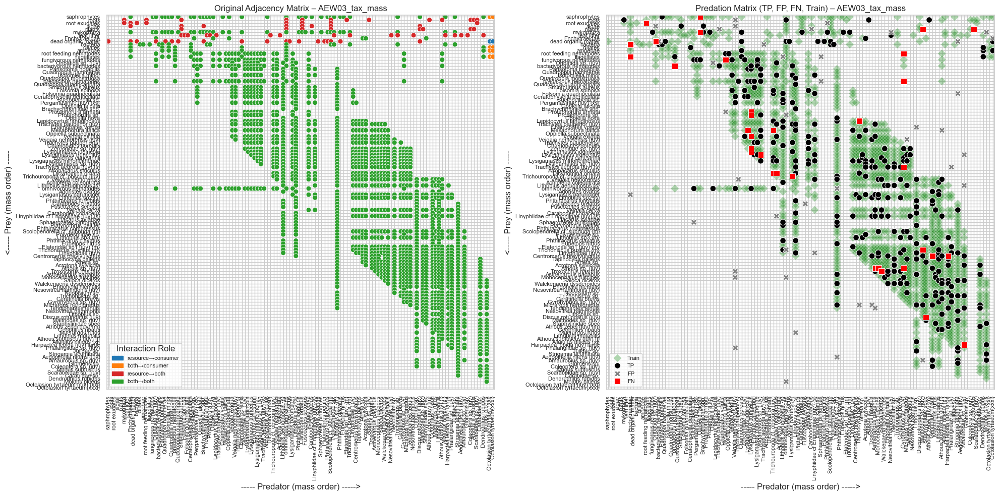


=== Processing: AEW17_tax_mass ===


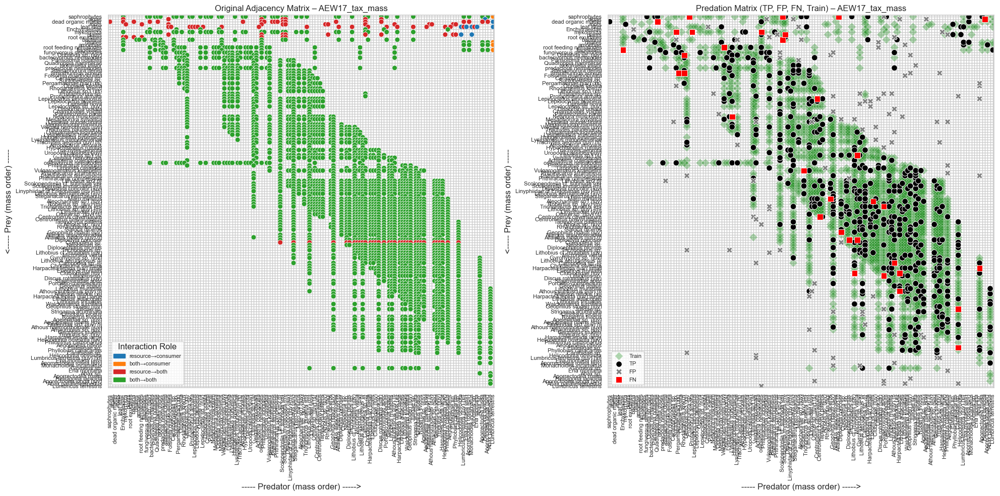


=== Processing: Grand Caricaie  marsh dominated by Cladietum marisci, mown  Clmown1_tax_mass ===


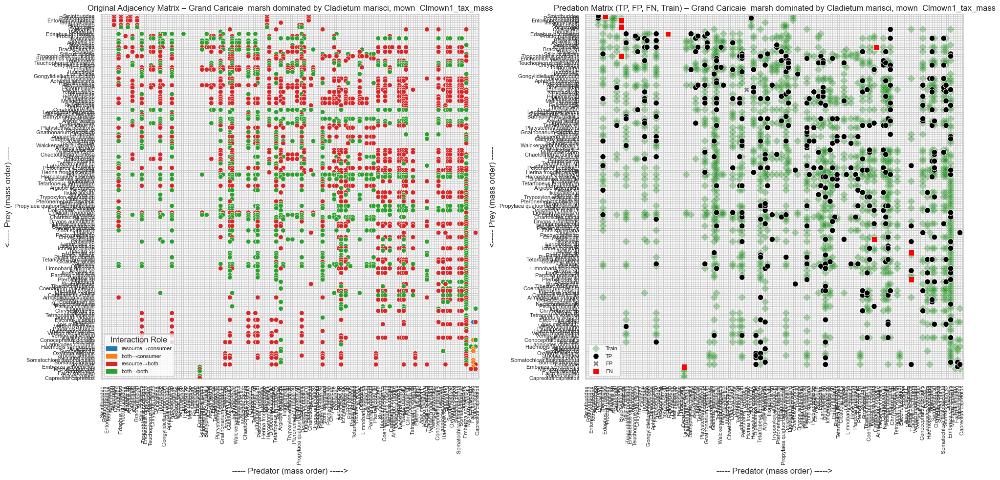

In [1]:
import os
import scipy.io
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from scipy.sparse import coo_matrix, csr_matrix

# Apply seaborn style
sns.set_theme(style="whitegrid", font_scale=1.0)

# === Load foodweb names list ===
foodwebs_list_df = pd.read_csv("../../src/matlab/data/foodwebs_mat/foodweb_metrics_small.csv")

# === Base paths ===
base_csv_path = "../../src/matlab/data/result_stable_version_290/confusion_matrix_csv"
base_mat_path = "../../src/matlab/data/foodwebs_mat"

# === Define fixed color map for Interaction Roles ===
fixed_color_map = {
    # More likely to happen
    "both→both": "#2ca02c",            # green
    "resource→both": "#d62728",        # red
    "both→consumer": "#ff7f0e",        # orange
    "resource→consumer": "#1f77b4",    # blue
    # Less likely to happen
    "consumer→consumer": "#bcbd22",    # olive
    # Never happens
    "consumer→both": "#9467bd",        # purple
    "consumer→resource": "#e377c2",    # pink
    "resource→resource": "#8c564b",    # brown
    "both→resource": "#17becf",        # cyan
}

# === Iterate over each foodweb ===
for foodweb in foodwebs_list_df["Foodweb"]:
    print(f"\n=== Processing: {foodweb} ===")

    try:
        # === Load CSV prediction results ===
        tp_file = os.path.join(base_csv_path, f"{foodweb}_K_10_random_ratio80_TP_links.csv")
        fp_file = os.path.join(base_csv_path, f"{foodweb}_K_10_random_ratio80_FP_links.csv")
        fn_file = os.path.join(base_csv_path, f"{foodweb}_K_10_random_ratio80_FN_links.csv")
        train_file = os.path.join(base_csv_path, f"{foodweb}_K_10_random_ratio80_train_links.csv")
        mat_file = os.path.join(base_mat_path, f"{foodweb}.mat")

        tp = pd.read_csv(tp_file).dropna(subset=['Prey', 'Predator'])
        fp = pd.read_csv(fp_file).dropna(subset=['Prey', 'Predator'])
        fn = pd.read_csv(fn_file).dropna(subset=['Prey', 'Predator'])

        # === Load .mat adjacency and metadata ===
        mat_data = scipy.io.loadmat(mat_file)
        net = mat_data['net']
        taxonomy = [str(t[0]) if isinstance(t, (list, np.ndarray)) else str(t) for t in mat_data['taxonomy'].flatten()]
        mass = mat_data['mass'].flatten()

        # === Sort species by mass ===
        taxonomy_df = pd.DataFrame({'Species': taxonomy, 'Mass': mass})
        taxonomy_df = taxonomy_df.dropna().sort_values(by='Mass').reset_index(drop=True)
        sorted_species = taxonomy_df['Species'].tolist()
        species_index = {name: i for i, name in enumerate(sorted_species)}
        N = len(sorted_species)
        sorted_species_reversed = sorted_species[::-1]

        # === Sort adjacency matrix by mass ===
        if isinstance(net, coo_matrix):
            net = net.tocsr()
        elif isinstance(net, (np.ndarray, list)):
            net = csr_matrix(net)
        idx_sorted = [taxonomy.index(sp) for sp in sorted_species]
        adj_sorted = net[np.ix_(idx_sorted, idx_sorted)].toarray().astype(float)

        # === Build DataFrame for Adjacency Matrix (non-zero links) with role ===
        am_rows, am_cols = np.where(adj_sorted == 1)
        df_am = pd.DataFrame({
            'PreyIdx': N - 1 - am_rows,  # flip y-axis
            'PredIdx': am_cols,
        })

        # === Load roles and assign to predators ===
        role_data = mat_data['role'].flatten()
        role_list = [str(r[0]) if isinstance(r, (np.ndarray, list)) else str(r) for r in role_data]
        taxonomy_list = [str(t[0]) if isinstance(t, (list, np.ndarray)) else str(t) for t in mat_data['taxonomy'].flatten()]
        role_lookup = dict(zip(taxonomy_list, role_list))

        # === Map Prey and Predator species to their roles ===
        prey_species_by_idx = [sorted_species[am_rows[i]] for i in range(len(am_rows))]
        pred_species_by_idx = [sorted_species[am_cols[i]] for i in range(len(am_cols))]

        # Rename only 'consumer-resource' → 'both'
        def rename_role(role):
            return 'both' if role == 'consumer-resource' else role

        prey_roles = [rename_role(role_lookup.get(sp, 'unknown')) for sp in prey_species_by_idx]
        pred_roles = [rename_role(role_lookup.get(sp, 'unknown')) for sp in pred_species_by_idx]

        # Define interaction type as "prey→pred"
        df_am['InteractionRole'] = [f"{prey}→{pred}" for prey, pred in zip(prey_roles, pred_roles)]

        # === Filter predictions to valid species ===
        tp = tp[tp['Prey'].isin(species_index) & tp['Predator'].isin(species_index)]
        fp = fp[fp['Prey'].isin(species_index) & fp['Predator'].isin(species_index)]
        fn = fn[fn['Prey'].isin(species_index) & fn['Predator'].isin(species_index)]

        # === Build DataFrame for Predation Matrix
        def make_df(df, label):
            return pd.DataFrame({
                'PreyIdx': df['Prey'].map(species_index),
                'PredIdx': df['Predator'].map(species_index),
                'Label': label
            })

        df_pm = pd.concat([
            make_df(tp, 'TP'),
            make_df(fp, 'FP'),
            make_df(fn, 'FN')
        ]).dropna().astype({'PreyIdx': int, 'PredIdx': int})
        df_pm['PreyIdx'] = N - 1 - df_pm['PreyIdx']

        # === Load Training Links (if available)
        df_train = None
        if os.path.isfile(train_file):
            train = pd.read_csv(train_file).dropna(subset=['Prey', 'Predator'])
            train = train[train['Prey'].isin(species_index) & train['Predator'].isin(species_index)]
            df_train = pd.DataFrame({
                'PreyIdx': train['Prey'].map(species_index),
                'PredIdx': train['Predator'].map(species_index),
                'Label': 'Train'
            })
            df_train['PreyIdx'] = N - 1 - df_train['PreyIdx']

        # === Plotting
        fig, axs = plt.subplots(1, 2, figsize=(20, 10))

        # === LEFT: Adjacency Matrix with colors for interaction roles ===
        # Use fixed color map for consistency
        interaction_roles_all = sorted(df_am['InteractionRole'].unique())
        interaction_palette_dict = {role: fixed_color_map.get(role, "#cccccc") for role in interaction_roles_all}

        sns.scatterplot(
            data=df_am,
            x='PredIdx',
            y='PreyIdx',
            hue='InteractionRole',
            palette=interaction_palette_dict,
            s=50,
            ax=axs[0]
        )

        axs[0].set_title(f"Original Adjacency Matrix – {foodweb}", fontsize=12)
        axs[0].set_xticks(range(N))
        axs[0].set_yticks(range(N))
        axs[0].set_xticklabels(sorted_species, rotation=90, fontsize=8)
        axs[0].set_yticklabels(sorted_species_reversed, fontsize=8)
        axs[0].set_xlabel("----- Predator (mass order) ----->")
        axs[0].set_ylabel("<----- Prey (mass order) -----")
        axs[0].invert_yaxis()
        axs[0].set_xlim(-0.5, N - 0.5)
        axs[0].set_ylim(-0.5, N - 0.5)
        axs[0].set_xticks(range(N))
        axs[0].set_yticks(range(N))
        axs[0].set_xticklabels(sorted_species, rotation=90, fontsize=8)
        axs[0].set_yticklabels(sorted_species_reversed, fontsize=8)
        axs[0].set_xlabel("----- Predator (mass order) ----->")
        axs[0].set_ylabel("<----- Prey (mass order) -----")
        axs[0].invert_yaxis()
        axs[0].set_xlim(-0.5, N - 0.5)
        axs[0].set_ylim(-0.5, N - 0.5)
        
        # Manual legend for fixed ordering and color consistency
        role_order = [
            "resource→consumer", "consumer→consumer", "consumer→resource", "resource→resource",
            "both→consumer", "consumer→both", "both→resource", "resource→both", "both→both"
        ]

        legend_patches = [
            mpatches.Patch(color=fixed_color_map[role], label=role) for role in role_order if role in interaction_roles_all
        ]

        axs[0].legend(handles=legend_patches, title="Interaction Role", loc="lower left", fontsize=8)

        # RIGHT: Predation Matrix
        ax = axs[1]
        ax.set_title(f"Predation Matrix (TP, FP, FN, Train) – {foodweb}", fontsize=12)
        ax.set_xticks(range(N))
        ax.set_yticks(range(N))
        ax.set_xticklabels(sorted_species, rotation=90, fontsize=8)
        ax.set_yticklabels(sorted_species_reversed, fontsize=8)
        ax.set_xlabel("----- Predator (mass order) ----->")
        ax.set_ylabel("<----- Prey (mass order) -----")
        ax.invert_yaxis()
        ax.set_xlim(-0.5, N - 0.5)
        ax.set_ylim(-0.5, N - 0.5)

        # Plot training links first (background), with low opacity and include in legend
        if df_train is not None:
            sns.scatterplot(data=df_train, x='PredIdx', y='PreyIdx', hue='Label', style='Label',
                            markers={'Train': 'D'}, palette={'Train': 'green'},
                            alpha=0.3, s=70, legend='brief', ax=ax)

        # Plot TP, FP, FN
        sns.scatterplot(data=df_pm, x='PredIdx', y='PreyIdx', hue='Label', style='Label',
                        markers={'TP': 'o', 'FP': 'X', 'FN': 's', 'Train': 'D'},
                        palette={'TP': 'black', 'FP': 'gray', 'FN': 'red', 'Train': 'green'},
                        s=70, ax=ax)

        ax.legend(loc='lower left', fontsize=8, title="")

        plt.tight_layout()
        plt.show()

    except Exception as e:
        print(f"Skipping {foodweb} due to error: {e}")